<a href="https://colab.research.google.com/github/mnsdali/Image-Detection-Generator-Project/blob/main/Image_Description_Generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install tqdm tensorflow keras pillow numpy tqdm 

# to get a file 
#!wget --no-check-certificate \
#    https://storage.googleapis.com/learning-datasets/sarcasm.json \
#    -O /tmp/sarcasm.json


In [ ]:
import string #for common string operations
import numpy as np #data processing (convolutions etc...)
from PIL import Image 
import os
import io
import pickle #files save and load at checkpoints

In [ ]:
from keras.applications.xception import Xception, preprocess_input
from keras.utils import img_to_array
from keras.utils import load_img
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.layers import add
from keras.models import Model, load_model
from keras.layers import Input, Dense, LSTM, Embedding, Dropout

In [ ]:
# small library for seeing the progress of loops.
from tqdm.notebook import tqdm
tqdm().pandas()

0it [00:00, ?it/s]

### Connect Drive Data Paths

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from googleapiclient.discovery import build 

In [ ]:
#Authenticate and create a PyDrive client
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
pydrive = GoogleDrive(gauth)

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Handle Descriptions Data

**load_doc( filename ) –** ` For loading the document file and reading the contents inside the file into a string.`

In [ ]:
def folder_exists_drive(folder_name):
  # Get a list of all files and folders in your Google Drive root directory
  file_list = pydrive.ListFile({'q': "'root' in parents and trashed=false"}).GetList()

  # Find the first folder with the matching name
  matching_folders = [file_obj for file_obj in file_list if file_obj['title'] == folder_name and file_obj['mimeType'] == 'application/vnd.google-apps.folder']
  return matching_folders

In [ ]:
def load_doc( filename ):
  # Opening the file as read only
  file = open(filename, 'r')
  text = file.read()
  file.close()
  return text

In [ ]:
def load_doc_drive( filename, file_id=None, folder_id=None ):
  if folder_id != None:
    # Get a list of all files in the matching folder
    file_list = pydrive.ListFile({'q': "'%s' in parents and trashed=false" % folder_id}).GetList()
    # Find the file with the matching name
    file_name = 'myfile.txt'
    matching_files = [file for file in file_list if file['title'] == filename]

    # Check if a matching file was found
    if not matching_files:
        print('The file %s does not exist in the folder %s.' % (file_name, folder_name))
    else:
        file_id = matching_files[0]['id']
        # Get the file object and read its content as a string
        fileObj = pydrive.CreateFile({'id': file_id})
        fileContent = fileObj.GetContentString()
  else:
    fileObj = pydrive.CreateFile({'id': file_id})
    fileContent = fileObj.GetContentString(filename)

  return fileContent


**all_img_captions( filename ) –** `This function will create a descriptions dictionary that maps images with a list of 5 captions. The descriptions dictionary will look something like this:`

In [ ]:
def all_img_captions( filename):
  text = load_doc(filename)
  captions = text.split('\n')
  descriptions = dict()
  for caption in captions[:-1]:
    img, caption = caption.split('\t')
    if img[:-2] in descriptions:
      descriptions[img[:-2]].append(caption)
    else:
      descriptions[img[:-2]] = [ caption ]
  return descriptions

In [ ]:
def all_img_captions_drive( filename, file_id=None, folder_id=None ):
  text = load_doc_drive(filename, file_id, folder_id )
  captions = text.split('\n')
  print(captions)
  descriptions ={}
  for caption in captions[:-1]:
      img, caption = caption.split('\t')
      if img[:-2] not in descriptions:
          descriptions[img[:-2]] = [ caption ]
      else:
          descriptions[img[:-2]].append(caption)
  return descriptions

cleaning_text( descriptions) –  

```
This function takes all descriptions and performs data cleaning. This is an important step when we work with textual data, according to our goal, we decide what type of cleaning we want to perform on the text. In our case, we will be removing punctuations, converting all text to lowercase and removing words that contain numbers.
```
`“A man riding on a three-wheeled wheelchair”` ~> `“man riding on three wheeled wheelchair”`



In [ ]:
def cleaning_text( descriptions):
  table = str.maketrans('','',string.punctuation)
  
  for img,captions in descriptions.items():
    for i,caption in enumerate(captions):
      #three-wheeled wheelchair ~> three wheeled wheelchair
      caption = caption.replace('-', ' ')
      #MAJ ~> maj
      caption = caption.lower()
      #handle each word individually
      desc = caption.split()
      #remove punctuations
      desc = [word.translate(table) for word in desc]
      #remove hanging 's and a
      desc = [word for word in desc if (len(word)>1)]
      #remove token words with numbers
      desc = [word for word in desc if (word.isalpha())]
      #convert back to string
      desc = ' '.join(desc)
      descriptions[img][i]=desc
  return descriptions
      
    


**text_vocabulary( descriptions ) –** `This is a simple function that will separate all the unique words and create the vocabulary from all the descriptions.`

In [ ]:
def text_vocabulary( descriptions ):
  vocab = set()
  for key in descriptions.keys():
   [vocab.update(caption.split()) for caption in descriptions[key]]
  return vocab

**save_descriptions( descriptions, filename ) –**   `This function will create a list of all the descriptions that have been preprocessed and store them into a file. We will create a descriptions.txt file to store all the captions.`


In [ ]:
def save_descriptions( descriptions, filename ):
  data = ""
  for img, captions in descriptions.items():
    for caption in captions:
      data += img + "\t"
      data += caption + "\n"
  
  file = open(filename,"w")
  file.write(data)
  file.close()

In [ ]:
def save_descriptions_drive( descriptions, file_name, folder_name):
  # Create a PyDrive folder object with the name of the new folder
  data = ""
  for img, captions in descriptions.items():
    for caption in captions:
      data += img + "\t"
      data += caption + "\n"

  #check folder existance
  matching_folders =  folder_exists_drive(folder_name)
  if not matching_folders:
    folder_obj = pydrive.CreateFile({'title': folder_name, 'mimeType': 'application/vnd.google-apps.folder'})
    folder_obj.Upload()
  else:
    folder_obj = {'id' : matching_folders[0]['id'] } 

  # Create a PyDrive file object with the title and contents of the new file
  file_title = file_name
  file_content = data
  file_obj = pydrive.CreateFile({'title': file_title, 'parents': [{'id': folder_obj['id']}]})
  file_obj.Upload()
  file_obj.SetContentString(file_content)
  file_obj.Upload()
  return file_obj['id']
  

In [ ]:
# Flickr8k_text.tokens file_id : 1foIcBIo6WkNCRp0u3Z_0lQ1_IySKPSYy 
Flickr8k_text_id = '1foIcBIo6WkNCRp0u3Z_0lQ1_IySKPSYy'
Flickr8k_text_name = 'Flickr8k.token.txt'

Flickr8k_text_folder_id ="1gez3S0vMYFWfYE33FZWBcImQOU7FlZSS"

# Flickr8k_text folder_id : 1gez3S0vMYFWfYE33FZWBcImQOU7FlZSS 
# Flickr8k_dataset_id = '1mr3mCrP98hADOU39bIHhpT7-CfTcfuT5'
# Flickr8k_dataset = drive.CreateFile({'id': Flickr8k_dataset_id})
# Flickr8k_dataset_content = Flickr8k_dataset.GetContentFile()

In [ ]:
#descriptions = all_img_captions_drive( Flickr8k_text_name, file_id=Flickr8k_text_id)
descriptions = all_img_captions_drive( Flickr8k_text_name, folder_id=Flickr8k_text_folder_id)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
print(descriptions)

{'1000268201_693b08cb0e.jpg': ['tofla sghira lebsa rouba rose tetsala9 fel drouj fi passage .', 'sghira mechya lbanya bel louh .', 'tofla sghira tetsala9 aal playhouse .', 'tofla sghira tetsala9 drouj lel playhouse .', 'tofla sghira lebsa rouba rose dekhla lel malja2 .'], '1001773457_577c3a7d70.jpg': ['kalb akhal maa kalb chefou walew yetaarkou', 'kalb akhal maa kalb tri-color yelaabou maa baadhhom fel kayés .', 'kalb akhal maa kalb abyadh aandou blayes marron yoghzrou lel baadhhom fel kayés .', 'zouz kleb bwjouh mokhtalfa yoghzrou lel baadhhom fel kayés .', 'zouz kleb mestalbsin yo9rbou lel baadhhom .'], '1002674143_1b742ab4b8.jpg': ['tofla sghira maabiya bel dohn 9e3da 9odem rainbow mersoum ww ydiha fel stal .', 'tofla sghira 9odem rainbow kbir mersoum .', 'tofla sghira fel gazon tel3ab bel basma 9odem canvas bidha fiha rainbow .', 'fama tofla bzouz groun 9e3da 9odem rasma mte3 rainbow .', 'tofla sghira bzouz groun torsem lbarra 3al gazon .'], '1003163366_44323f5815.jpg': ['rajel mos

In [ ]:
print("Length of descriptions =" ,len(descriptions))

Length of descriptions = 8092


In [ ]:
#cleaning the descriptions
clean_descriptions = cleaning_text(descriptions)
clean_descriptions

{'1000268201_693b08cb0e.jpg': ['tofla sghira lebsa rouba rose fel drouj fi passage',
  'sghira mechya lbanya bel louh',
  'tofla sghira aal playhouse',
  'tofla sghira drouj lel playhouse',
  'tofla sghira lebsa rouba rose dekhla lel'],
 '1001773457_577c3a7d70.jpg': ['kalb akhal maa kalb chefou walew yetaarkou',
  'kalb akhal maa kalb tri color yelaabou maa baadhhom fel kayés',
  'kalb akhal maa kalb abyadh aandou blayes marron yoghzrou lel baadhhom fel kayés',
  'zouz kleb bwjouh mokhtalfa yoghzrou lel baadhhom fel kayés',
  'zouz kleb mestalbsin lel baadhhom'],
 '1002674143_1b742ab4b8.jpg': ['tofla sghira maabiya bel dohn rainbow mersoum ww ydiha fel stal',
  'tofla sghira rainbow kbir mersoum',
  'tofla sghira fel gazon bel basma canvas bidha fiha rainbow',
  'fama tofla bzouz groun rasma rainbow',
  'tofla sghira bzouz groun torsem lbarra gazon'],
 '1003163366_44323f5815.jpg': ['rajel korsy ww kalb bahdheh',
  'rajel korsy elly kalb abyadh marbout fih',
  'rajel korsy lbara kalba b

In [ ]:
#building vocabulary 
vocabulary = text_vocabulary(clean_descriptions)
print("Length of vocabulary (number of unique words)= ", len(vocabulary))

Length of vocabulary (number of unique words)=  8832


In [ ]:
folder_name = 'Image Description Generator Ouptput'
file_name = "descriptions.txt"
clean_descriptions_file_id="1ZXRKlXnJCObuiin7Xs7qmvIDrOJvowzh" 
# if you want to train data uncomment this line###################!!!!!!!!!!!!!!!
#clean_descriptions_file_id = save_descriptions_drive( descriptions, file_name, folder_name)


# Extracting the feature vector from all images

This technique is also called transfer learning, we don’t have to do everything on our own, we use the pre-trained model that have been already trained on large datasets and extract the features from these models and use them for our tasks. We are using the Xception model which has been trained on imagenet dataset that had 1000 different classes to classify. We can directly import this model from the keras.applications . Make sure you are connected to the internet as the weights get automatically downloaded. Since the Xception model was originally built for imagenet, we will do little changes for integrating with our model. One thing to notice is that the Xception model takes 299*299*3 image size as input. We will remove the last classification layer and get the 2048 feature vector.

**extract_features() -** `will extract features for all images and we will map image names with their respective feature array. Then we will dump the features dictionary into a “features.p” pickle file.`

In [ ]:
def upload_folder_drive(folder_id):
  # List all files in the folder
  file_list = pydrive.ListFile({'q': f"'{folder_id}' in parents and trashed=false"}).GetList()

  return file_list

In [ ]:

def get_image_files(folder_id, drive_service):
  query = f"'{folder_id}' in parents and trashed=false"
  _files = []
  # loop through the pages of files in the folder
  
  file_list = pydrive.ListFile({'q': query}).GetList()

  # Iterate over all pages of results until there are no more files left to retrieve
  while file_list:
    _files.extend(file_list)
    
    # Get the next page token, if it exists
    try:
      next_page_token = file_list.GetNextPageToken()
    except AttributeError:
      break
    
    # Query the next page of results
    file_list = pydrive.ListFile({'q': query,
                                'pageToken': next_page_token}).GetList()
  return _files


In [ ]:

def extract_features(folder_id):
  model = Xception( include_top=False, pooling='avg' )
  drive_service = build('drive', 'v3')
  features = {}
  files = get_image_files(folder_id, drive_service)
  
  print(len(files))
  # Loop through the files and open them as images with Pillow
  for file in tqdm(files):
    if file['mimeType'] == 'image/jpeg' or file['mimeType'] == 'image/png':
      img = file['title']
      image_file = drive_service.files().get_media(fileId=file['id']).execute()
      image_content = io.BytesIO(image_file)
      image = Image.open(image_content)
      # Do something with the image, such as displaying or processing it
      image = image.resize((299,299))
      image = np.expand_dims(image, axis=0)
      #image = preprocess_input(image)
      image = image/127.5
      image = image - 1.0
      feature = model.predict(image)
      features[img] = feature

  return features

In [ ]:
def pickle_dump_drive(toDumpObj, fileName, folderName):
  #check folder existance
  matching_folders =  folder_exists_drive(folder_name)
  if not matching_folders:
    folder_obj = pydrive.CreateFile({'title': folder_name, 'mimeType': 'application/vnd.google-apps.folder'})
    folder_obj.Upload()
  else:
    folder_obj = {'id' : matching_folders[0]['id'] } 
  

  
  
  # Serialize and write the object to the file using pickle.dump()


  
  pickle.dump(toDumpObj, open(fileName,"wb"))  
  # Create a new file in the folder with the name 'my_pickle_file.pickle'
  pickle_file = pydrive.CreateFile({'title': fileName, 'parents': [folder_obj], 'mimeType': 'application/octet-stream'})
  
  pickle_file.SetContentFile(fileName)
  # Set the file content type to be binary
  pickle_file.Upload()

  

  # Print the link to the file in your Google Drive
  print(f"File uploaded in: {pickle_file['alternateLink']}")
  return pickle_file['id']

In [ ]:
def pickle_load_drive(fileName, file_id):
  # Create a new file object from the pickled file
  pickle_file = pydrive.CreateFile({'id': file_id})

  # Download the pickled file to the local filesystem
  pickle_file.GetContentFile(fileName)

  # Deserialize and load the object using pickle.load()
  # Load the pickled object from the file
  
  my_object = pickle.load(open(fileName, 'rb'))

  return my_object

In [ ]:
#2048 feature vector
images_dataset_directory = '1Z37AcadnmmeOEQFxe8C23HrddCLNvF98'
features = extract_features(images_dataset_directory)



83683744/83683744 [==============================] - 0s 0us/step
8334


  0%|          | 0/8334 [00:00<?, ?it/s]

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
1/1 [==============================] - 0s 22ms/step


In [ ]:
rootFolder = 'Image Description Generator Ouptput'
features_file_name = 'features.p'
features_file_id = '1tKFvPevf5oDxexC7mIgKG8kWY9_eZbrr'

In [ ]:
#getting the pickle file google drive's alternate link's id 

############ IMPORTANT NOTE: if you extracted features yourself !!!!!!!!!!!!!!!!!
############ ^^^^^^^^^ uncomment this line !!!!!!!!!!!!!!!!!!!!!!

#features_file_id = pickle_dump_drive(features, features_file_name, rootFolder) 

##########################

File uploaded in: https://drive.google.com/file/d/1tKFvPevf5oDxexC7mIgKG8kWY9_eZbrr/view?usp=drivesdk


In [ ]:
#load features.p using pickle from drive
features = pickle_load_drive("features.p", features_file_id)
print(features_file_id)

1tKFvPevf5oDxexC7mIgKG8kWY9_eZbrr


In [ ]:
print(descriptions)

{'1000268201_693b08cb0e.jpg': ['tofla sghira lebsa rouba rose fel drouj fi passage', 'sghira mechya lbanya bel louh', 'tofla sghira aal playhouse', 'tofla sghira drouj lel playhouse', 'tofla sghira lebsa rouba rose dekhla lel'], '1001773457_577c3a7d70.jpg': ['kalb akhal maa kalb chefou walew yetaarkou', 'kalb akhal maa kalb tri color yelaabou maa baadhhom fel kayés', 'kalb akhal maa kalb abyadh aandou blayes marron yoghzrou lel baadhhom fel kayés', 'zouz kleb bwjouh mokhtalfa yoghzrou lel baadhhom fel kayés', 'zouz kleb mestalbsin lel baadhhom'], '1002674143_1b742ab4b8.jpg': ['tofla sghira maabiya bel dohn rainbow mersoum ww ydiha fel stal', 'tofla sghira rainbow kbir mersoum', 'tofla sghira fel gazon bel basma canvas bidha fiha rainbow', 'fama tofla bzouz groun rasma rainbow', 'tofla sghira bzouz groun torsem lbarra gazon'], '1003163366_44323f5815.jpg': ['rajel korsy ww kalb bahdheh', 'rajel korsy elly kalb abyadh marbout fih', 'rajel korsy lbara kalba bidha ww akhal bahdheh', 'rajel 

# Loading dataset for Training the model

In our **Flickr_8k_test** folder, we have **Flickr_8k.trainImages.txt** file that contains a list of 6000 image names that we will use for training.

load_photos( filename ) – `This will load the text file in a string and will return the list of image names.`

In [ ]:
def load_photos( fileName, folder_id):
  text = load_doc_drive(fileName, folder_id=folder_id)
  imgs = text.split('\n')
  return imgs

**load_clean_descriptions( filename, photos ) –** `This function will create a dictionary that contains captions for each photo from the list of photos. We also append the <start> and <end> identifier for each caption. We need this so that our LSTM model can identify the starting and ending of the caption.`

In [ ]:
def load_clean_descriptions(fileName, file_id, photos):
  file = load_doc_drive(fileName, file_id=file_id)
  descriptions = {}
  for line in file.split('\n'):


    words = line.split()
    #if line is empty then skip it
    if len(words)<1: 
      continue
    
    img, caption = words[0], words[1:]

    if img in photos:
      if img not in descriptions:
        descriptions[img] = []
      caption = '<start>' + ' '.join(caption) + ' <end>'
      descriptions[img].append(caption)

  return descriptions

**load_features(photos) –** `This function will give us the dictionary for image names and their feature vector which we have previously extracted from the Xception model.`

In [ ]:
def load_features(features_file_name, features_file_id, photos ):
  #load the full extracted features
  all_features = pickle_load_drive(features_file_name, features_file_id)
  
  #fetch only the features of the photos that exist in photos list
  features = { photo: all_features[photo] for photo in photos if photo in all_features }
  return features
  

In [ ]:
train_imgs_text = 'Flickr_8k.trainImages.txt'

train_imgs = load_photos(train_imgs_text, folder_id=Flickr8k_text_folder_id)
train_descriptions = load_clean_descriptions('descriptions.txt', clean_descriptions_file_id, train_imgs)


In [ ]:
print(train_descriptions)

{'1000268201_693b08cb0e.jpg': ['<start>tofla sghira lebsa rouba rose fel drouj fi passage <end>', '<start>sghira mechya lbanya bel louh <end>', '<start>tofla sghira aal playhouse <end>', '<start>tofla sghira drouj lel playhouse <end>', '<start>tofla sghira lebsa rouba rose dekhla lel <end>'], '1001773457_577c3a7d70.jpg': ['<start>kalb akhal maa kalb chefou walew yetaarkou <end>', '<start>kalb akhal maa kalb tri color yelaabou maa baadhhom fel kayés <end>', '<start>kalb akhal maa kalb abyadh aandou blayes marron yoghzrou lel baadhhom fel kayés <end>', '<start>zouz kleb bwjouh mokhtalfa yoghzrou lel baadhhom fel kayés <end>', '<start>zouz kleb mestalbsin lel baadhhom <end>'], '1002674143_1b742ab4b8.jpg': ['<start>tofla sghira maabiya bel dohn rainbow mersoum ww ydiha fel stal <end>', '<start>tofla sghira rainbow kbir mersoum <end>', '<start>tofla sghira fel gazon bel basma canvas bidha fiha rainbow <end>', '<start>fama tofla bzouz groun rasma rainbow <end>', '<start>tofla sghira bzouz gr

In [ ]:
train_features = load_features('features.p', features_file_id, train_imgs)

# Tokenizing the vocabulary

Computers don’t understand English words, for computers, we will have to represent them with numbers. So, we will map each word of the vocabulary with a unique index value. Keras library provides us with the tokenizer function that we will use to create tokens from our vocabulary and save them to a “**tokenizer.p**” pickle file.

In [ ]:
#converting dictionary to clean list of descriptions
def dict_to_list(descriptions):
  all_desc = []
  for key in descriptions.keys():
    [all_desc.append(d) for d in descriptions[key]]
  return all_desc

In [ ]:
#creating tokenizer class 
#this will vectorise text corpus
#each integer will represent token in dictionary

from keras.preprocessing.text import Tokenizer
def create_tokenizer(descriptions):
  desc_list = dict_to_list(descriptions)
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(desc_list)
  return tokenizer

In [ ]:
# give each word an index, and store that into tokenizer.p pickle file
tokenizer = create_tokenizer(train_descriptions)
#getting the pickle file google drive's alternate link's id 
tokenizer_file_id = pickle_dump_drive(tokenizer, "tokenizer.p", rootFolder)

File uploaded in: https://drive.google.com/file/d/1-n7wemvTEC-USnDNjUi1SEfKFLea1lpJ/view?usp=drivesdk


In [ ]:
tokenizer_file_id = '1NPc5LhJ0wot0sCWQVKhMoPwz3TgWvzRv'
tokenizer = pickle_load_drive("tokenizer.p", tokenizer_file_id)


In [ ]:
print(train_descriptions)

{'1000268201_693b08cb0e.jpg': ['<start>tofla sghira lebsa rouba rose fel drouj fi passage <end>', '<start>sghira mechya lbanya bel louh <end>', '<start>tofla sghira aal playhouse <end>', '<start>tofla sghira drouj lel playhouse <end>', '<start>tofla sghira lebsa rouba rose dekhla lel <end>'], '1001773457_577c3a7d70.jpg': ['<start>kalb akhal maa kalb chefou walew yetaarkou <end>', '<start>kalb akhal maa kalb tri color yelaabou maa baadhhom fel kayés <end>', '<start>kalb akhal maa kalb abyadh aandou blayes marron yoghzrou lel baadhhom fel kayés <end>', '<start>zouz kleb bwjouh mokhtalfa yoghzrou lel baadhhom fel kayés <end>', '<start>zouz kleb mestalbsin lel baadhhom <end>'], '1002674143_1b742ab4b8.jpg': ['<start>tofla sghira maabiya bel dohn rainbow mersoum ww ydiha fel stal <end>', '<start>tofla sghira rainbow kbir mersoum <end>', '<start>tofla sghira fel gazon bel basma canvas bidha fiha rainbow <end>', '<start>fama tofla bzouz groun rasma rainbow <end>', '<start>tofla sghira bzouz gr

In [ ]:
vocab_size = len(tokenizer.word_index) + 1
vocab_size

7663

We calculate the **maximum length** of the descriptions. This is important for deciding the model structure parameters. Max_length of description is 32.

In [ ]:
#calculate maximum length of descriptions
def max_length(descriptions):
    desc_list = dict_to_list(descriptions)
    return max(len(d.split()) for d in desc_list)

In [ ]:
max_length = max_length(descriptions)
max_length

27

# Create Data generator

Let us first see how the input and output of our model will look like. To make this task into a supervised learning task, we have to provide input and output to the model for training. We have to train our model on 6000 images and each image will contain 2048 length feature vector and caption is also represented as numbers. This amount of data for 6000 images is not possible to hold into memory so we will be using a generator method that will yield batches.

The generator will yield the input and output sequence.

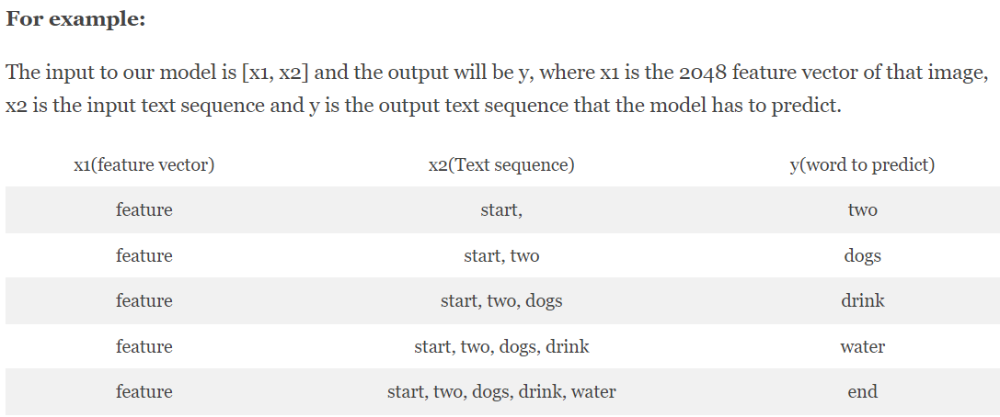

In [ ]:
def create_sequences(tokenizer, max_length, desc_list, feature):
    X1, X2, y = list(), list(), list()
    # walk through each description for the image
    for desc in desc_list:
        # encode the sequence
        seq = tokenizer.texts_to_sequences([desc])[0]
        # split one sequence into multiple X,y pairs
        for i in range(1, len(seq)):
            # split into input and output pair
            in_seq, out_seq = seq[:i], seq[i]
            # pad input sequence
            in_seq = pad_sequences([in_seq], maxlen=max_length, padding='pre')[0]
            # encode output sequence
            out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
            # store
            X1.append(feature)
            X2.append(in_seq)
            y.append(out_seq)
    return np.array(X1), np.array(X2), np.array(y)

In [ ]:
#data generator, used by model.fit_generator()
def data_generator(descriptions, features, tokenizer, max_length):
    while 1:
        for img, description_list in descriptions.items():
            #retrieve photo features
            feature = features[img][0]
            input_image, input_sequence, output_word = create_sequences(tokenizer, max_length, description_list, feature)
            yield [[input_image, input_sequence], output_word]

In [ ]:
#You can check the shape of the input and output for your model
[a,b],c = next(data_generator(train_descriptions, features, tokenizer, max_length))

In [ ]:
a.shape, b.shape, c.shape

((35, 2048), (35, 27), (35, 7663))

# Defining the CNN-RNN model

To define the structure of the model, we will be using the Keras Model from Functional API. It will consist of three major parts:

**Feature Extractor –** `The feature extracted from the image has a size of 2048, with a dense layer, we will reduce the dimensions to 256 nodes.`

**Sequence Processor –** `An embedding layer will handle the textual input, followed by the LSTM layer.`

**Decoder –** `By merging the output from the above two layers, we will process by the dense layer to make the final prediction. The final layer will contain the number of nodes equal to our vocabulary size.`

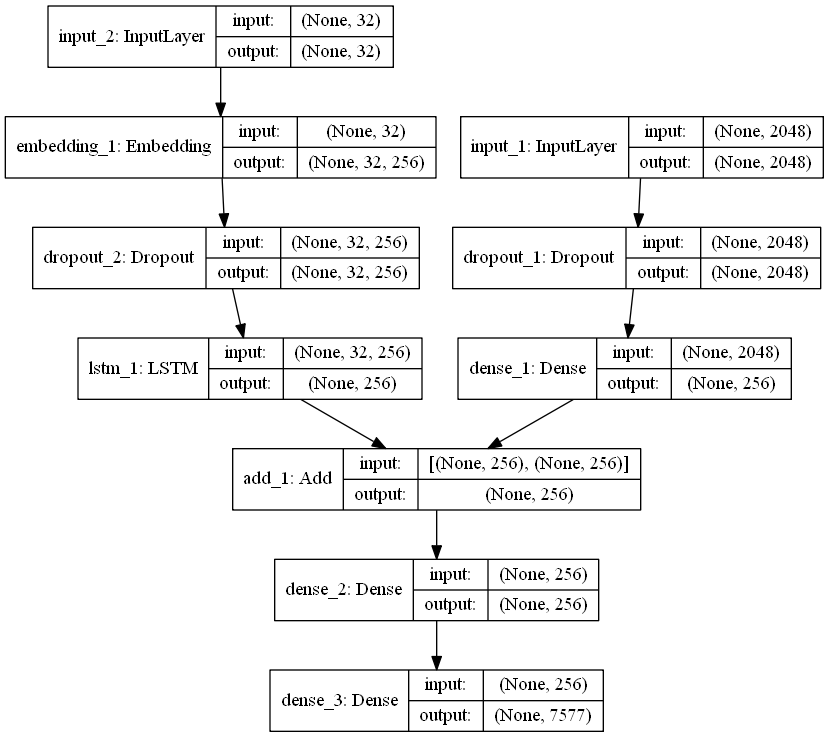

In [ ]:
from keras.utils import plot_model
# define the captioning model
def define_model(vocab_size, max_length):
    # features from the CNN model squeezed from 2048 to 256 nodes
    inputs1 = Input(shape=(2048,))
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)
    # LSTM sequence model
    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.5)(se1)
    se3 = LSTM(256)(se2)
    # Merging both models
    decoder1 = add([fe2, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(vocab_size, activation='softmax')(decoder2)

    
    # tie it together [image, seq] [word]
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(loss='categorical_crossentropy', optimizer='adam')
    
    return model


In [ ]:
def stats_model(model):
  # summarize model
  print(model.summary())
  plot_model(model, to_file='model.png', show_shapes=True)


In [ ]:
model = define_model(vocab_size, max_length)

In [ ]:
stats_model(model)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 32)]         0           []                               
                                                                                                  
 input_10 (InputLayer)          [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 32, 256)      1961728     ['input_11[0][0]']               
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_10[0][0]']               
                                                                                              

# Training the model

To train the model, we will be using the 6000 training images by generating the input and output sequences in batches and fitting them to the model using model.fit_generator() method. We also save the model to our models folder. This will take some time depending on your system capability.

In [ ]:
# train our model
print('Dataset: ', len(train_imgs))
print('Descriptions: train=', len(train_descriptions))
print('Photos: train=', len(train_features))
print('Vocabulary Size:', vocab_size)
print('Description Length: ', max_length)
epochs = 10
steps = len(train_descriptions)

# making a directory models to save our models
if not os.path.isdir("models"):
    os.mkdir("models")

for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, tokenizer, max_length)
    model.fit_generator(generator, epochs=1, steps_per_epoch= steps, verbose=1)
    model.save("models/model_" + str(i) + ".h5")

Dataset:  6001
Descriptions: train= 6000
Photos: train= 6000
Vocabulary Size: 7663
Description Length:  27


<ipython-input-51-5c86016cc8d0>:16: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch= steps, verbose=1)


 151/6000 [..............................] - ETA: 8:15 - loss: 3.0015

KeyboardInterrupt: ignored

In [ ]:
# Get the weights of the model
model_weights_name= "model_w.h5"





In [ ]:
weights = model.get_weights()
modelw_file_id = pickle_dump_drive(weights, model_weights_name, rootFolder)
model.save("models/model_1.h5")

File uploaded in: https://drive.google.com/file/d/1HEo5W-Q_4JcDOcmDpf2hu0TTcJ7S2IUu/view?usp=drivesdk


In [ ]:
with open('model_w.h5', 'rb') as f:
    weights = pickle.load(f)
model.set_weights(weights)

# Testing the model

The model has been trained, now, we will make a separate file testing_caption_generator.py which will load the model and generate predictions. The predictions contain the max length of index values so we will use the same tokenizer.p pickle file to get the words from their index values.

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import argparse

In [ ]:
ap = argparse.ArgumentParser()
ap.add_argument('-i', '--image', required=True, help="Image Path")
args = vars(ap.parse_args())
img_path = args['image']

usage: ipykernel_launcher.py [-h] -i IMAGE
ipykernel_launcher.py: error: the following arguments are required: -i/--image


SystemExit: ignored

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
!pip install gdown
import gdown
import urllib.request
import requests
from io import BytesIO

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def openDriveImage(fileId):
  drive_service = build('drive', 'v3')
  image_file = drive_service.files().get_media(fileId=fileId).execute()
  image_content = io.BytesIO(image_file)
  image = Image.open(image_content)

  return image

In [ ]:
def getDriveImage(filePath):
  q = "drive.google.com/file/d/"
  if q in filePath:
    return filePath[filePath.find(q)+len(q):filePath.find("/view")]
  return False

In [ ]:
def extract_features(filePath, model):
  try:
    
    fileId = getDriveImage(filePath)
    if type(fileId)==str:
      
      image = openDriveImage(fileId)
      print(image)
    else:
      response = requests.get(filePath)
      image = Image.open(BytesIO(response.content))
    resImage = image
    image = image.resize((299,299))
    image = np.array(image)
    # for images that has 4 channels, we convert them into 3 channels
    if image.shape[2] == 4: 
      image = image[..., :3]
    image = np.expand_dims(image, axis=0)
    image = image/127.5
    image = image - 1.0
    feature = model.predict(image)
    return  image, feature
    
  except FileNotFoundError:
    print(f"ERROR: File not found at path {filePath}")
  except PermissionError:
    print(f"ERROR: Permission denied while trying to open {filePath}")
  except Exception as e:
    print(f"ERROR: {str(e)}")
    
  
  

In [ ]:
def word_for_id(integer, tokenizer):
  for word, index in tokenizer.word_index.items():
    if index == integer:
      return word
  return None

In [ ]:
def generate_desc(model, tokenizer, photo, max_length):
  in_text = 'start'
  for i in range(max_length):
    sequence = tokenizer.texts_to_sequences([in_text])[0]
    sequence = pad_sequences([sequence], maxlen=max_length)
    pred = model.predict([photo,sequence], verbose=0)
    pred = np.argmax(pred)
    word = word_for_id(pred, tokenizer)
    if word is None:
      break
    in_text += ' ' + word
    if word == 'end':
      break
  return in_text

In [ ]:
tokenizer_file_id = '1NPc5LhJ0wot0sCWQVKhMoPwz3TgWvzRv'
tokenizer = pickle_load_drive("tokenizer.p", tokenizer_file_id)

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
#path = 'Flicker8k_Dataset/111537222_07e56d5a30.jpg'
img_path = "https://drive.google.com/file/d/1PCp-Ed5VMxJ2M4xFHGC61j0-uZNhSNGX/view?usp=share_link"
max_length = 32
xception_model = Xception(include_top=False, pooling="avg")
img, photo = extract_features(img_path, xception_model)
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(openDriveImage(getDriveImage(img_path)))

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x332 at 0x7F88DA862080>
1/1 [==============================] - 1s 746ms/step



start rajel fi maryoul abyadh is sitting on rock end


TypeError: ignored

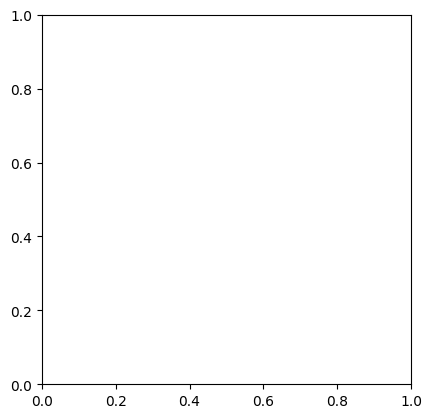